### Исследование рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. 

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно. 

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
_____
##### Описание данных

Путь к файлу: [Скачать датасет](https://code.s3.yandex.net/datasets/moscow_places.csv)

Структура `/datasets/moscow_places.csv`:

- `name` — название заведения; 
- `address` — адрес заведения; 
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»; 
- `hours` — информация о днях и часах работы; 
- `lat` — широта географической точки, в которой находится заведение; 
- `lng` — долгота географической точки, в которой находится заведение; 
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0); 
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее; 
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
   - «Средний счёт: 1000–1500 ₽»; 
   - «Цена чашки капучино: 130–220 ₽»; 
   - «Цена бокала пива: 400–600 ₽». 
и так далее; 
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. 
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. 
   - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт. 
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. 
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. 
   - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт. 
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки); 
- `district` — административный район, в котором находится заведение, например Центральный административный округ; 
- `seats` — количество посадочных мест.


Границы районов Москвы, которые встречаются в датасете, хранятся в файле `admin_level_geomap.geojson`
______

**Данное исследование разделим на несколько частей.**

##### Часть 1. Изучение общей информации:

1. Изучение файла с данными, получение общей информации, загрузка библиотек;
2. Вывод.

##### Часть 2. Предобработка данных:

1. Нахождение и исправление дубликатов, пропусков, аномалий и ошибок;
2. Добавление столбца `street` с названиями улиц из столбца с адресом, а также столбца `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
   - логическое значение True — если заведение работает ежедневно и круглосуточно;
   - логическое значение False — в противоположном случае.
3. Вывод.

##### Часть 3. Анализ данных:

1. Изучение категорий заведений;
2. Исследование количества посадочных мест в местах по категориям;
3. Изучение соотношение сетевых и несетевых заведений в датасете;
4. Изучение административных округов Москвы в разрезе заведений;
5. Исследование рейтингов;
6. Отображение всех заведений датасета на карте с помощью кластеров средствами библиотеки folium;
7. Исследование улиц, на которых расположены заведения датасета;
8. Изучение средних чеков заведений и построение хороплета для каждого района;
9. Выводы.

##### Часть 4. Детализация исследования: открытие кофейни

1. Подсчет кофеен в датасете по районам, поиск особенностей их расположения;
2. Поиск круглосуточных кофеен;
3. Просмотр рейтинга кофеен и распределение по районам;
4. Исследование гипотетической стоимости чашки капучино при открытии;
5. Cоотношение сетевых и несетевых кофеен;
6. Выводы.

##### Часть 4. Выводы по исследованию

##### Часть 5. Подготовка презентации

## Изучение общей информации

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv') #, sep="\t")
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None

In [3]:
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
display(data.info())
print('Количество пропусков:')
display(data.isna().sum())
print('Количество явных дубликатов:', (data.duplicated().sum()))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Количество пропусков:


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Количество явных дубликатов: 0


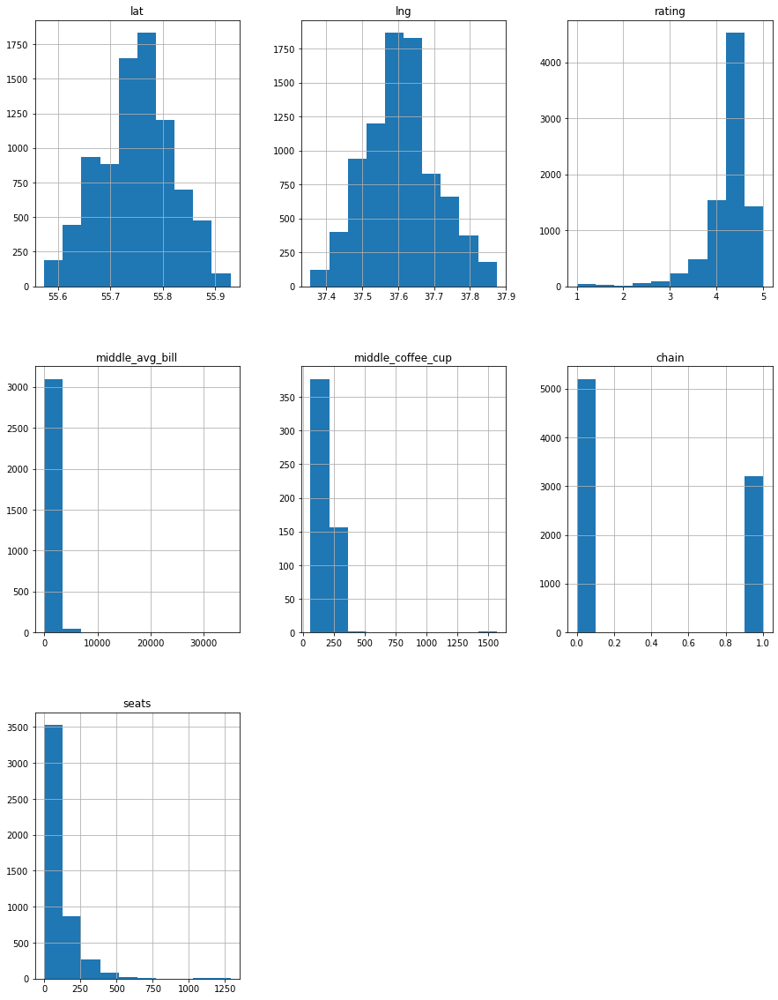

In [5]:
data.hist(figsize=(15, 20));

Первые два распредления выглдят нормальными, распределение столбца с рейтингом смещено вправо - в датасете много заведений с высоким рейтингом (выше 4), средний чек в большинстве случаев находится в пределах 5 000 рублей, чашка капучино - до 250 рублей, количество посадочных мест смещено слево - больше всего заведений с количеством мест до 125.

### **Вывод**

1. В данных представлено 8406 заведений;
2. Явные дубликаты не обнаружены;
3. Типы данных верные;
4. Пропуски обнаружены в столбцах: `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`;
5. В датасете много заведений с высоким рейтингом (> 4);
6. Cредний чек в большинстве случаев находится в пределах 5 000 рублей, чашка капучино - до 250 рублей;
7. Больше всего заведений с количеством мест до 125.

## Предобработка данных

Проверим, есть ли дубликаты в столбцах с названием и в столбцах с адресом.

In [6]:
print('Количество дубликатов в столбце с названиями:', data['name'].duplicated().sum())
print('Количество дубликатов в столбце с адресом:', data['address'].duplicated().sum())
print('Количество дубликатов в столбцах название-адрес:', data[['name', 'address']].duplicated().sum())
display(data[data.duplicated(['address'])]) # выведем строки с дубликатами
display(data[data.duplicated(['name'])].sort_values(by=['name'], ascending=True))

Количество дубликатов в столбце с названиями: 2792
Количество дубликатов в столбце с адресом: 2653
Количество дубликатов в столбцах название-адрес: 0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0
31,Алталия,быстрое питание,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878691,37.478993,4.1,NaN,NaN,NaN,NaN,0,NaN
41,Крошка Картошка,быстрое питание,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878515,37.479308,4.1,NaN,NaN,NaN,NaN,1,NaN
48,БлинБери,ресторан,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.878511,37.479158,3.9,NaN,NaN,NaN,NaN,1,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5069,10 Идеальных Пицц,ресторан,"Москва, улица Большие Каменщики, 9сЕ",Центральный административный округ,"ежедневно, 11:45–22:30",55.738074,37.656047,4.3,NaN,NaN,NaN,NaN,1,NaN
7590,10 Идеальных Пицц,ресторан,"Москва, улица Паустовского, 6, корп. 1",Юго-Западный административный округ,"ежедневно, 11:45–22:30",55.600224,37.539004,4.3,NaN,NaN,NaN,NaN,1,150.0
4723,18 Грамм,кофейня,"Москва, набережная Академика Туполева, 15Б",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.760838,37.681958,4.4,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,1,NaN
3282,18 Грамм,кофейня,"Москва, Шелепихинская набережная, 34, корп. 2",Северо-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.762761,37.509574,4.6,NaN,NaN,NaN,NaN,1,NaN
4632,7 Сэндвичей,кофейня,"Москва, 4-й Сыромятнический переулок, 3/5с3",Центральный административный округ,"ежедневно, 09:00–19:00",55.754957,37.667534,4.2,средние,Средний счёт:160–500 ₽,330.0,NaN,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5201,Яндекс.Лавка,ресторан,"Москва, улица Большие Каменщики, 9сИ",Центральный административный округ,"ежедневно, 07:00–02:00",55.738444,37.655364,3.5,NaN,NaN,NaN,NaN,1,NaN
3107,Яндекс.Лавка,ресторан,"Москва, улица Академика Павлова, 50",Западный административный округ,"ежедневно, 07:00–00:00",55.746817,37.409400,2.8,NaN,NaN,NaN,NaN,1,NaN
7497,Японская кухня,ресторан,"Москва, Мячковский бульвар, 3А",Юго-Восточный административный округ,"ежедневно, 10:00–02:00",55.658020,37.751564,4.3,NaN,NaN,NaN,NaN,1,0.0
7031,Японская кухня,кафе,"Москва, Балаклавский проспект, 14А",Южный административный округ,NaN,55.641926,37.606743,4.4,NaN,NaN,NaN,NaN,1,150.0


Дубликаты в столбце с названиями - это сетевые заведения, в столбце с адресами - это разные заведения в одном здании, номогут быть неявные дубликаты, например, названия заведений, записанные разным способом. Приведем названия к нижнемну регистру, уберем ненужные тире, точки, кавычки и т.д. и проверим датасет на дубликаты снова.

In [7]:
data['name'] = data['name'].str.lower()
data['name'] = data['name'].str.replace("."," ")
data['name'] = data['name'].str.replace(","," ")
data['name'] = data['name'].str.replace("-"," ")
data['name'] = data['name'].str.replace('"'," ")
data['name'] = data['name'].str.replace(":"," ")
data['name'] = data['name'].str.replace("ё","е")
data['address'] = data['address'].str.lower()
data['address'] = data['address'].str.replace("ё","е")
print('Количество дубликатов в столбцах название-адрес:', data[['name', 'address']].duplicated().sum())

Количество дубликатов в столбцах название-адрес: 4


/tmp/ipykernel_379/231164348.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  data['name'] = data['name'].str.replace("."," ")


In [8]:
# избавимся от дубликатов 
data = data.drop_duplicates(subset=['name', 'address']).reset_index(drop=True)
print('Количество дубликатов в столбцах название-адрес:', data[['name', 'address']].duplicated().sum())

Количество дубликатов в столбцах название-адрес: 0


Пропуски были обнаружены в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`, проверим, какую долю они составляют от всего объема данных.

In [10]:
data.isna().mean().reset_index().style.format({0: '{:.2%}'})

,index,0
0,name,0.00%
1,category,0.00%
2,address,0.00%
3,district,0.00%
4,hours,6.37%
5,lat,0.00%
6,lng,0.00%
7,rating,0.00%
8,price,60.55%
9,avg_bill,54.58%


Доля пропусков в столбце `hours` небольшая, оставим как есть. Столбец `price` нет возможности заполнить актуальными данными. Столбец `avg_bill` далее разделяется на столбцы `middle_avg_bill` и `middle_coffee_cup`, поэтому оставим его как есть. Далее обработаем столбцы `middle_avg_bill` и `seats`. Столбец `middle_coffee_cup` обработаем позже в разделе 4. Детализация исследования: открытие кофейни

Доля пропусков в столбце `seats` довольно высокая, по статистической сводке по столбцу можно сделать вывод, что рациональнее использовать медиану для заполнения пропусков, так как есть выбросы. Данный способ заполнения строк можно считать корректным, так как количество посадочных мест может быть примерно одинаковым, в зависимости от категории заведения.

In [11]:
display(data['seats'].describe())
for t in data['category'].unique():
    data.loc[(data['category'] == t) & (data['seats'].isna()), 'seats'] = \
    data.loc[(data['category'] == t), 'seats'].median()
print('Доля пропусков в столбце seats:', 
      (data['seats'].isna().sum() / len(data) * 100).round(2)) #проверяем остались ли пропуски

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Доля пропусков в столбце seats: 0.0


Доля пропусков в столбце `middle_avg_bill` высокая, по статистической сводке по столбцу можно сделать вывод, что можно использовать медиану для заполнения пропусков. Данный способ заполнения строк можно считать корректным, так как средний чек не должен сильно отличаться у заведений одной категории.

In [12]:
display(data['middle_avg_bill'].describe())
for t in data['category'].unique():
    data.loc[(data['category'] == t) & (data['middle_avg_bill'].isna()), 'middle_avg_bill'] = \
    data.loc[(data['category'] == t), 'middle_avg_bill'].median()
print('Доля пропусков в столбце middle_avg_bill:', 
      (data['middle_avg_bill'].isna().sum() / len(data) * 100).round(2)) #проверяем остались ли пропуски

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

Доля пропусков в столбце middle_avg_bill: 0.0


Создадим столбец `street` с названиями улиц из столбца с адресом, столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7) c логическими значениями True/False.

In [13]:
# чтобы вручную не искать присутствующие в данных типы улиц, 
# дополнительно нашли все типы улиц по семантическому значению слова, проверим их все

street_list = ['улица','аллея', 'бульвар', 'вал', 'взвоз', 'дорога', 'квартал',
                   'кольцо', 'линия', 'луч', 'магистраль', 'набережная', 'переулок', 'площадь',
                   'проезд', 'проспект', 'проулок', 'ряд', 'cпуск', 'съезд', 
                   'дорога', 'мост', 'станция', 'территория', 'тракт', 'тупик', 'шоссе', 
                   'переулок', 'просек', 'парк', 'сквер', 'сад', 'роща']

# напишем функцию, возвращающую названия улиц
def get_street(row):
    address = row['address'].split(',')
    parts = len(address)
    for item in street_list:
            for i in range(parts):
                if item in address[i]:
                    return address[i]

data['street'] = data.apply(get_street, axis=1)
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,550.0,NaN,0,60.0,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,400.0,170.0,0,80.0,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,600.0,NaN,0,55.0,ижорская улица,False
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица,False
7,mr уголек,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,клязьминская улица,False
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,ангарская улица,False


In [14]:
# выведем пропуски в столбце street
pd.set_option("display.max_colwidth", 200)
data[data['street'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,60.0,None,False
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,60.0,None,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,400.0,NaN,1,80.0,None,False
78,ресторан самарканд,ресторан,"москва, мкад, 82-й километр, вл18",Северо-Восточный административный округ,"ежедневно, 09:00–01:00",55.909009,37.558619,4.2,средние,Средний счёт:600 ₽,600.0,NaN,0,86.0,None,False
108,кафе,"бар,паб","москва, мкад, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,1250.0,NaN,0,82.0,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8258,лесной,кафе,"москва, юго-восточный административный округ, район кузьминки",Юго-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.690712,37.784333,4.9,NaN,NaN,550.0,NaN,0,60.0,None,False
8262,беседка,кафе,"москва, юго-восточный административный округ, район кузьминки",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690708,37.787755,4.2,NaN,NaN,550.0,NaN,1,60.0,None,False
8324,скарабей,кафе,"москва, мкад, 8-й километр, 3, корп. 1",Юго-Восточный административный округ,"ежедневно, 07:00–18:00",55.704585,37.834507,4.1,NaN,NaN,550.0,NaN,0,60.0,None,False
8356,сетевое кафе,кафе,"москва, юго-восточный административный округ, район кузьминки",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.693629,37.781027,3.3,NaN,NaN,550.0,NaN,0,60.0,None,False


Проруски остались в тех строках, где в столбце `address` не указаны улицы или похожее на них обозначение. Посчитаем долю пропусков.

In [15]:
print('Доля пропусков в столбце street:', (data['street'].isna().sum() / len(data) * 100).round(2))

Доля пропусков в столбце street: 1.36


Процент небольшой, поэтому оставим как есть.

### **Вывод**

1. Были обработаны столбцы с пропусками: в столбцах `seats`, `middle_avg_bill` пропуски были заполнены медианным значениями по категориям заведений, столбцы `hours`, `price`, `avg_bill` оставили как есть, пропуски в столбце `middle_coffee_cup` будут обработаны при детализации исследования (открытие кофейни);
2. Добавлены столбцы `street` с названиями улиц из столбца с адресом, `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7);
3. Доля пропусков в новом столбце `street` составила 1,36%

## Анализ данных

###  Изучение категорий заведений

Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализацию. Ответим на вопрос о распределении заведений по категориям.

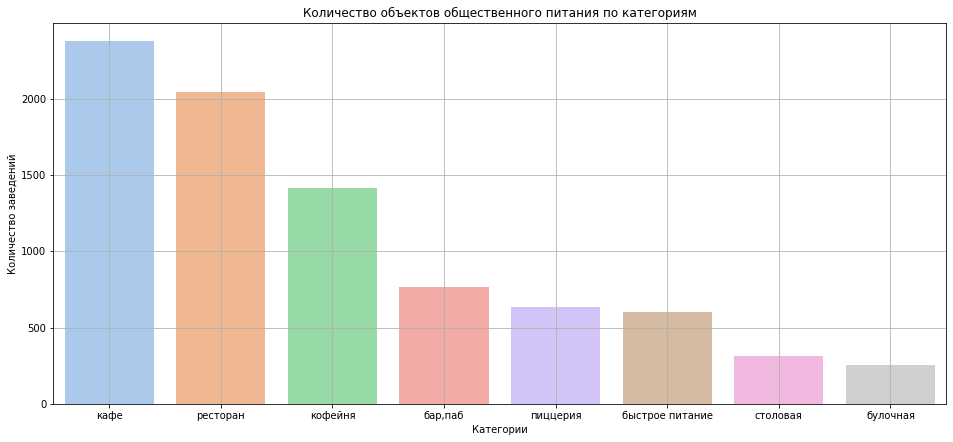

In [16]:
data['category'].unique() #посмотрим уникальные значения столбца category

sns.set_palette('pastel') # установим палетку

# сгруппируем данные по категории и количеству
category_distr = data.groupby('category')['name'].agg('count') \
.sort_values(ascending=False).reset_index()

# построим визуализацию
plt.figure(figsize=(16, 7))
sns.barplot(x='category', y='name', data=category_distr)
plt.grid(True)
plt.title('Количество объектов общественного питания по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории');

Большую долю среди заведений занимают кафе (28.3%), рестораны (24.3), кофейни (16.8%). Остальные категории занимают 30% данных.

### Исследование количества посадочных мест

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализацию. Проанализируем результаты и сделаем выводы. Будем использовать медиану, так как разброс по количеству мест достаточно большой.

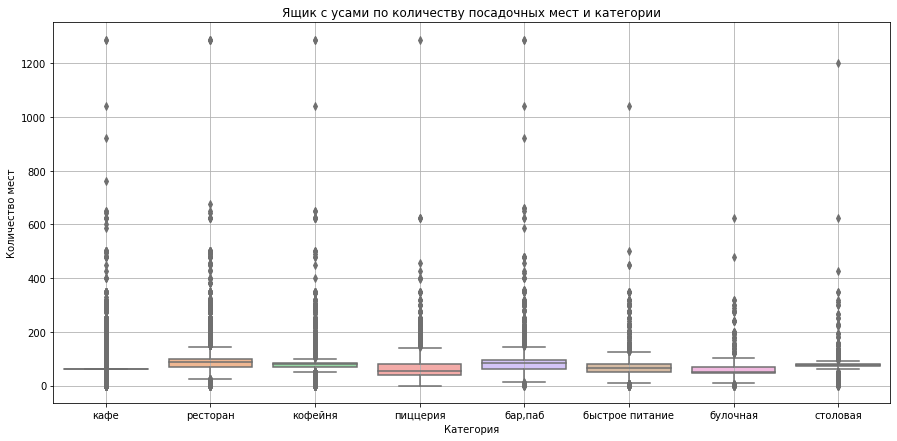

In [17]:
# построим ящики с усами
plt.figure(figsize=(15, 7))
sns.boxplot(x='category', y='seats', data=data)
plt.grid(True)
plt.title('Ящик с усами по количеству посадочных мест и категории')
plt.ylabel('Количество мест')
plt.xlabel('Категория');

Видим необычные выбросы в заведениях, где количество мест превышает 600. Можем посмотреть на эти заведения.

In [18]:
display(len(data.query('seats >= 600')))
data.query('seats >= 600')

54

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1325,нам,"бар,паб","москва, ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 11:00–21:00",55.803236,37.517898,4.2,NaN,NaN,1250.0,NaN,1,625.0,ленинградский проспект,False
1350,максима пицца,пиццерия,"москва, ленинградский проспект, 78, корп. 1",Северный административный округ,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",55.805807,37.513994,4.3,выше среднего,Средний счёт:1500–1800 ₽,1650.0,NaN,0,625.0,ленинградский проспект,False
1354,страдивари,ресторан,"москва, ленинградский проспект, 77, корп. 1",Северный административный округ,"ежедневно, 11:00–23:00",55.804980,37.509454,4.2,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,1,625.0,ленинградский проспект,False
1366,академия,пиццерия,"москва, ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.805579,37.520086,4.2,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,1,625.0,ленинградский проспект,False
1379,север метрополь,кофейня,"москва, ленинградский проспект, 75, корп. 1",Северный административный округ,"ежедневно, 09:00–21:00",55.804940,37.512423,4.6,NaN,NaN,400.0,NaN,1,625.0,ленинградский проспект,False
1384,чайхона на соколе,кафе,"москва, ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.803236,37.517931,4.3,средние,Средний счёт:400–800 ₽,600.0,NaN,0,625.0,ленинградский проспект,False
1392,кулинарная лавка братьев караваевых,кафе,"москва, ленинградский проспект, 72, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.805791,37.520339,4.3,NaN,Средний счёт:500–800 ₽,650.0,NaN,1,625.0,ленинградский проспект,False
1441,abc coffee roasters,кофейня,"москва, ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.805547,37.520395,4.5,средние,Цена чашки капучино:220–270 ₽,400.0,245.0,0,625.0,ленинградский проспект,False
1445,9 bar coffee,кофейня,"москва, ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.810352,37.506625,4.3,NaN,Цена чашки капучино:60–150 ₽,400.0,105.0,1,625.0,ленинградский проспект,False
1463,находка,ресторан,"москва, ленинградский проспект, 74, корп. 1",Северный административный округ,"ежедневно, 09:00–22:00",55.804972,37.517319,4.9,NaN,NaN,1250.0,NaN,1,625.0,ленинградский проспект,False


Скорее всего, это неверное заполненные данные, но таких заведений немного, поэтому не будем убирать их из датасета, а смотреть будем по медиане.

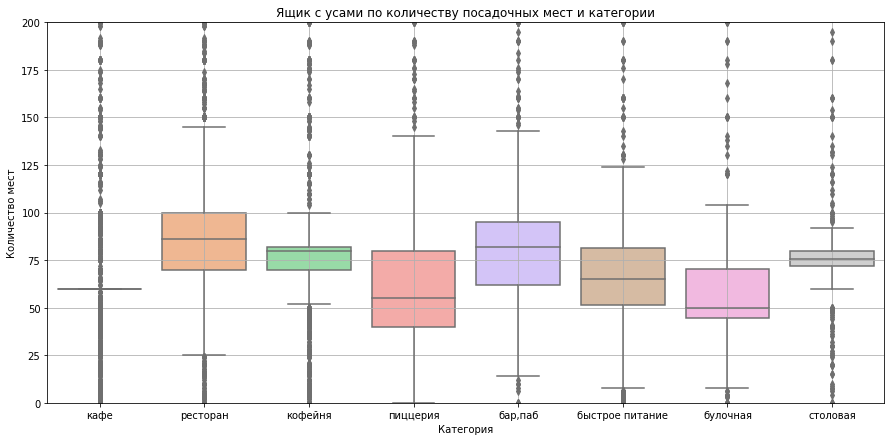

In [19]:
# посмотрим на ящики поближе
plt.figure(figsize=(15, 7))
sns.boxplot(x='category', y='seats', data=data)
plt.grid(True)
plt.ylim([0, 200])
plt.title('Ящик с усами по количеству посадочных мест и категории')
plt.ylabel('Количество мест')
plt.xlabel('Категория');

Видим, что у категории кафе 25, 50 и 75 перцентиль равны 60, так получилось из-за замены пропусков медианой. У остальных заведений медиана расположена от 50 до 100 сидячих мест.

,category,seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


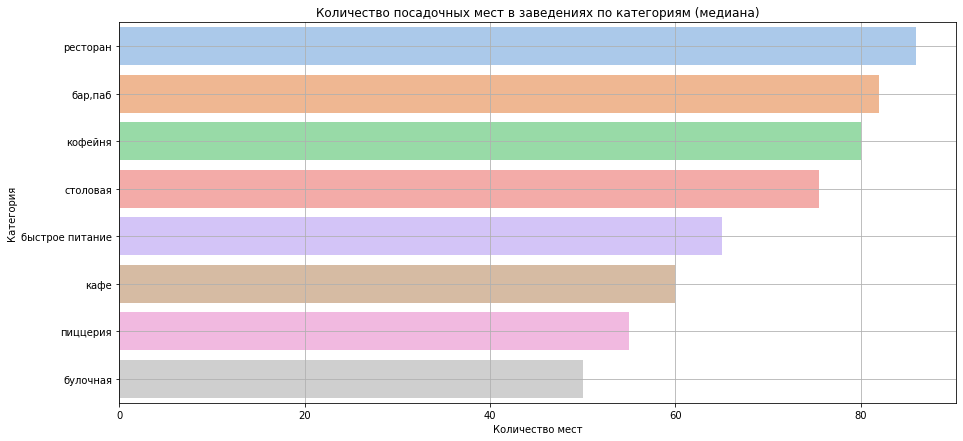

In [20]:
# сгруппируем данные по категории и медианному количеству мест
category_seats = data.groupby('category')['seats'].agg('median').sort_values(ascending=False).reset_index()
display(category_seats)

# построим визуализацию
plt.figure(figsize=(15, 7))
sns.barplot(x='seats', y='category', data=category_seats)
plt.grid(True)
plt.title('Количество посадочных мест в заведениях по категориям (медиана)')
plt.ylabel('Категория')
plt.xlabel('Количество мест');

Среди представленных заведений, самое большое количество посадочных мест наблюдается у ресторанов и баров/пабов (в медиане) - 86 и 82 посадочных места, далее идут кофени с 80 посадочными местами, столовые - 75, быстрое питание и кафе - 65 и 60, пиццерии - 55 и замыкает рейтинг булочные с 50 посадочными местами.

Можем сделать вывод, что в местах, где ожидается продолжительное пребывание гостей (рестораны, бары/пабы, кофейни) в среднем больше посадочных мест, чем в местах, где визит гостя планируется недолгим (столовая, пиццерия, кафе, булочная).

### Изучение сетевых и несетевых заведений

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

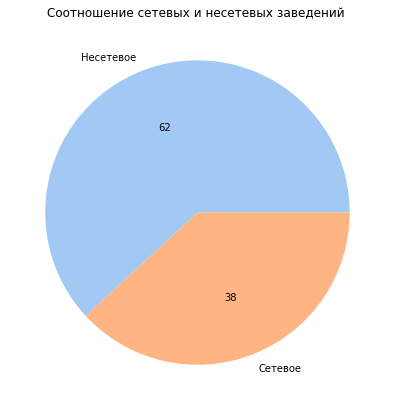

In [21]:
# изменим значения столбца chain для удобства
data['chain'].replace(to_replace= (0,1), value = ('Несетевое', 'Сетевое'), inplace=True)

# построим визуализацию
plt.figure(figsize=(25, 7))
data['chain'].value_counts().plot(kind='pie', autopct='%.0f')
plt.title('Cоотношение сетевых и несетевых заведений ')
plt.ylabel(None)
plt.show()

В рассматриваемом датасете преобладают несетевые заведения - 62 % против 38%. Однако следует помнить, что для маленьких сетей могут встречаться ошибки.

Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.

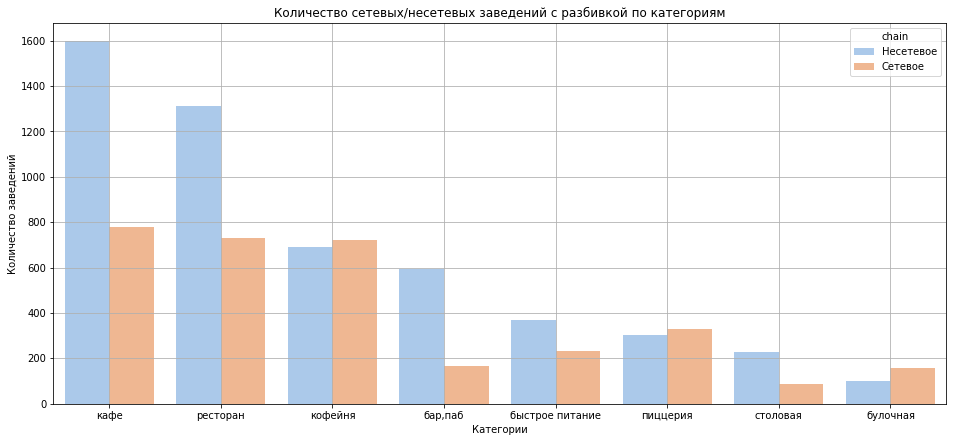

In [22]:
# сгруппируем данные по категории, типу сетевые/несетевые и количеству
category_seats_chain = data.groupby(['category', 'chain'])['name'].agg('count') \
.sort_values(ascending=False).reset_index()

# построим визуализацию
plt.figure(figsize=(16, 7))
sns.barplot(x='categoryy', y='name', data=category_seats_chain, hue='chain')
plt.grid(True)
plt.title('Количество сетевых/несетевых заведений с разбивкой по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории');

Пиццерии и булочные чаще являются сетевыми, а кафе, рестораны, бары/пабы и столовые - несетевыми, кофейни - 50/50.

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построим подходящую для такой информации визуализацию. Знакомы ли нам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразим общее количество заведений и количество заведений каждой категории по округам.

,name,category
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,яндекс лавка,72
4,one price coffee,71
5,cofix,65
6,prime,50
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39
10,теремок,38


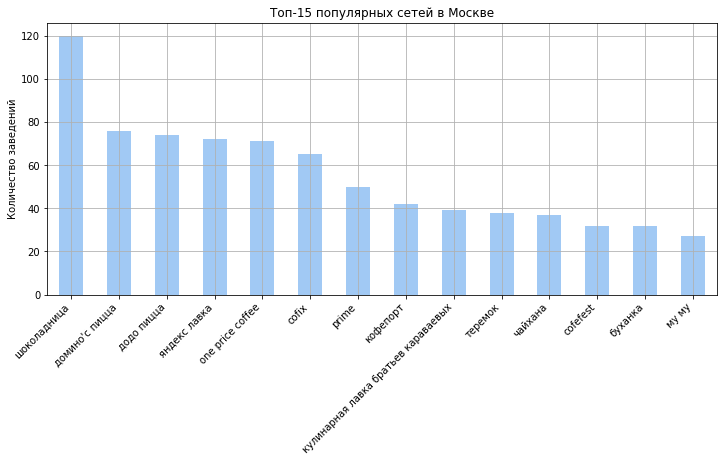

In [23]:
# отфильтруем сетевые заведения и сгоруппируем данные по категориям и количеству
top15_chain = data.query('chain == "Сетевое"').groupby('name')['category'].agg('count') \
    .sort_values(ascending=False).reset_index().head(15)
top15_chain = top15_chain.query('name != "хинкальная"')
display(top15_chain)

# построим визуализацию
top15_chain.plot(kind='bar', x='name', grid=True, figsize=(12, 5), legend=None)
plt.title('Топ-15 популярных сетей в Москве')
plt.ylabel('Количество заведений')
plt.xlabel(None)
plt.xticks(rotation=45, ha='right');

Самая популярная сеть в датасете - Шоколадница (120 заведений), далее идут менее крупные сети: Домино'c Пицца, Додо Пицца, One Price Coffee (более 70), Яндекс Лавка, Cofix, Prime (более 50), остальные сетевые заведения представлены в количестве менее 50. Данные бренды являются известными по территории России и некоторые даже за рубежом, многие заведеня сетей работают по модели франшизы. Большинство из них относятся к категориям кофейни, пиццерии и булочные. 

In [24]:
# сгруппируем данные по округам и категориям, выделим топ-15

top15_chain_category_district = data.query('chain == "Сетевое"').groupby(['category', 'district'])['name'].agg('count') \
    .sort_values(ascending=False).reset_index().head(15)

# построим визуализацию
px.bar(top15_chain_category_district, x='district', y='name', color='category', 
       color_discrete_sequence=px.colors.qualitative.Set2) \
       .update_layout(title='Топ-15 популярных категорий сетевых заведений с разбивкой по округам',
       yaxis_title='Количество заведений', 
       xaxis_title='Округ', \
       legend_title="", plot_bgcolor='rgba(0,0,0,0)', width=800, height=500)

Среди Топ-15 сетевых заведений наибольшее количество категорий представлено в ЦАО, в ЗАО представлены все популярные сетевые категории, кроме баров/пабов, в других округах представлены две или одна категории.

###  Изучение административных округов Москвы

Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам, проиллюстрировав эту информацию одним графиком.

In [25]:
# посмотрим, какие административные округа Москвы присутствуют в датасете
data['district'].unique().tolist()

['Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Западный административный округ',
 'Центральный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Южный административный округ',
 'Юго-Западный административный округ']

In [26]:
# сгруппируем данные по округам и категориям
category_district = data.groupby(['district', 'category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)
# построим визуализацию
px.bar(category_district, x='name', y='district', color='category', 
       color_discrete_sequence=px.colors.qualitative.Set2) \
       .update_layout(title='Распределение количества заведений по округам', yaxis_title='Округ', 
       xaxis_title='Количество заведений', \
       legend_title="", plot_bgcolor='rgba(0,0,0,0)', width=900, height=500)

В ЦАО наблюдается наибольшее количество заведений по всем категориям, но лидируют рестораны, кафе, кофейни и бары/пабы, результат ожидаемый, ведь это центральный округ Москвы. ЦАО примечателен тем, что там расположен деловой центр Москвы, то есть много офисных зданий, а также именно центр Москвы больше всего интересует туристов, поэтому в центре высокая проходимость, этим пользуется бизнес, открывая заведения по многим категориям. 

Тройка лидеров категорий - ресторан, кафе, кофейня - наблюдается во всех округах, но лидирующую позицию по количеству заведений занимает категория кафе. 

### Исследование рейтингов

Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

[5.  4.5 4.6 4.4 4.7 4.8 4.3 4.9 4.2 4.1 4.  3.8 3.9 3.7 3.6 2.8 2.7 3.1
 1.5 2.  1.4 3.3 3.5 3.2 2.9 3.  3.4 2.3 2.2 2.5 2.6 1.7 1.  1.1 2.4 1.3
 1.2 2.1 1.8 1.9 1.6]


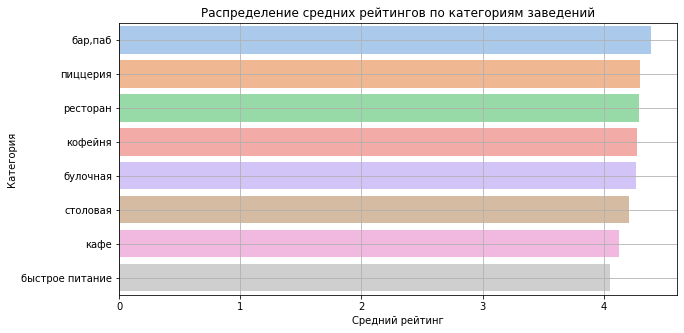

In [27]:
# посмотрим все уникальные значения рейтинга
print(data['rating'].unique())

# сгруппируем данные по категории и рейтингу, выделив средние значения рейтинга
rating_distr = data.groupby('category')['rating'].agg('mean') \
    .sort_values(ascending=False).reset_index()

# построим визуализацию
plt.figure(figsize=(10, 5))
sns.barplot(x='rating', y='category', data=rating_distr)
plt.grid(True)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.ylabel('Категория')
plt.xlabel('Средний рейтинг');

По графику видно, что усреднённые рейтинги в разных типах общепита отличаются незначительно. Самый высокий средний рейтинг наблюдается у баров/пабов, самый низкий - быстрое питание.

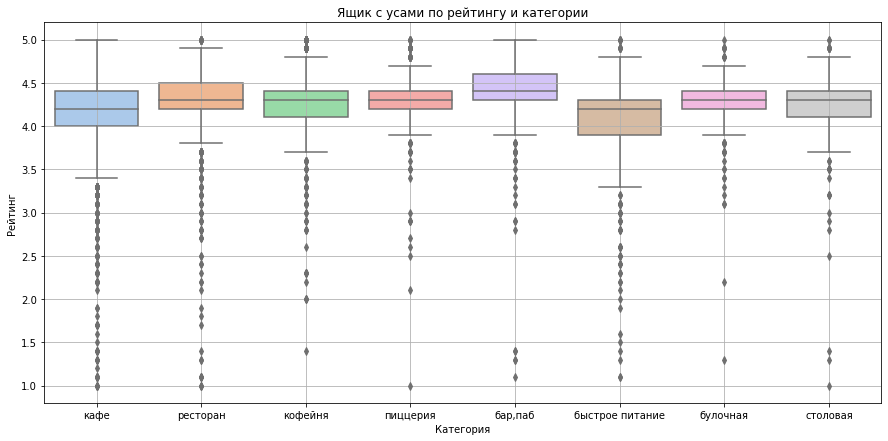

In [28]:
# построим ящики с усами
plt.figure(figsize=(15, 7))
sns.boxplot(x='category', y='rating', data=data)
plt.grid(True)
plt.title('Ящик с усами по рейтингу и категории')
plt.ylabel('Рейтинг')
plt.xlabel('Категория');

Видим, что медиана рейтинга по всем заведениям находится в пределах 4 и 4.5, то есть рейтинги в датасете достаточно высокие. Рейтинги ниже 3 уже выглядят как выбросы.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого округа. Границы округов Москвы, которые встречаются в датасете, хранятся в файле `admin_level_geomap.geojson`

In [29]:
# Для каждого округа посчитаем средний рейтинг заведений, которые находятся на его территории:
rating_district = data.groupby('district', as_index=False)['rating'].agg('mean')

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги, ожидаемо, получили заведения, находящиеся в ЦАО. Самые низкие - в ЮВАО. Но разница небольшая, как мы исследовали ранее, не превышает 0.7 значения.

### Кластеризация заведений 

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [30]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Большинство заведений датасета расположены в ЦАО, и чем ближе к центру, тем заведений больше. Если рассматривать округи отдельно, то можно заметить, что количество заведений больше в торговых центрах, парках или рядом со станциями метро, то есть там, где потенциально можно привлечь больше клиентов.

###  Исследование улиц

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,люблинская улица,60


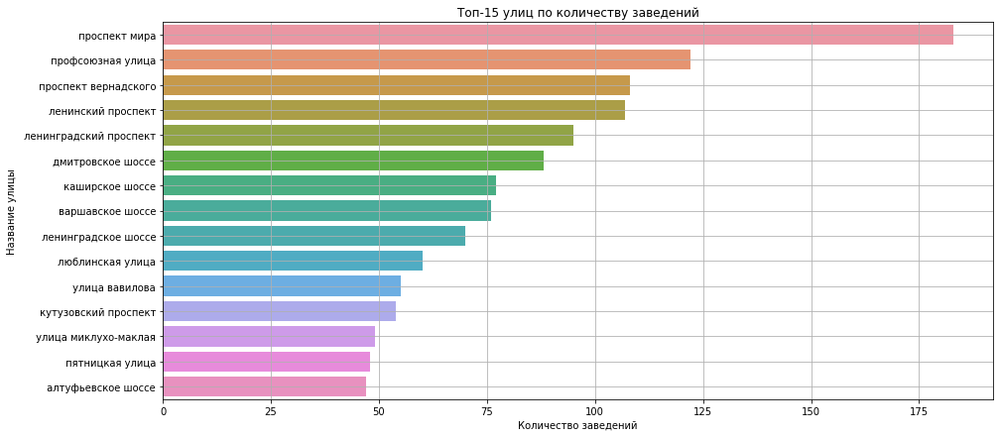

In [31]:
# сгруппируем данные по улицам, выделим топ-15 улиц по количеству заведений

top15_street = data.groupby('street')['name'].agg('count') \
    .sort_values(ascending=False).reset_index().head(15)

display(top15_street)

# построим визуализацию
plt.figure(figsize=(15, 7))
sns.barplot(x='name', y='street', data=top15_street)
plt.grid(True)
plt.title('Топ-15 улиц по количеству заведений')
plt.ylabel('Название улицы')
plt.xlabel('Количество заведений');

Лидирующей улицей по количеству заведений является проспект Мира - более 175 заведений, более 100 заведений расположены на улицах Профсоюзная, проспект Вернадского, Ленинский проспект, более 75 - Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, на остальных улицах находится менее 75 заведений.

In [32]:
# сгруппируем данные по улицам и категориям

category_street = data.groupby(['category', 'street'])['name'].agg('count') \
    .sort_values(ascending=False).reset_index()

# выделим улицы из Топ-15
top15_category_street = category_street[category_street['street'].isin(top15_street['street'])]

# построим визуализацию
px.bar(top15_category_street, x='name', y='street', color='category',  
       color_discrete_sequence=px.colors.qualitative.Set2) \
       .update_layout(title='Распределение количества заведений и их категорий среди Топ-15 улиц по кол-ву заведений',
       yaxis_title='Улица', 
       xaxis_title='Количество заведений', \
       legend_title="", plot_bgcolor='rgba(0,0,0,0)', width=900, height=500)

На лидирующей улице по количеству заведений - проспекте Мира - большего всего заведений из категории кафе, далее идут рестораны и кофейни, а также быстрое питание. На других улицах в большей степени преобладает количество заведений категории ресторан, только на улице Вавилова, Каширском шоссе, улице Миклухо-Маклая количество кафе незначительно преобладает над кол-во ресторанов.

Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях? 

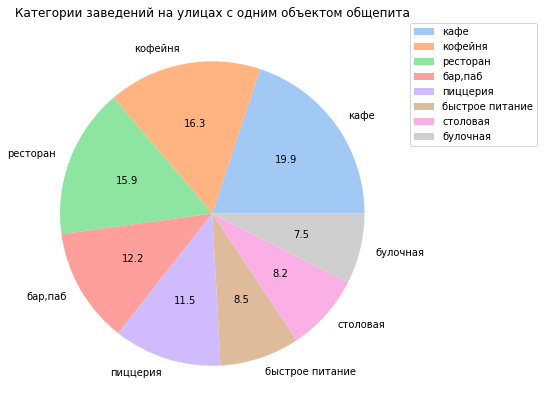

In [33]:
# найдем улицы, на которых находится только один объект общепита
one_object = data.groupby(['district', 'category', 'street'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False).query('name == 1')

# посмотрим, какие из категорий чаще встречаются на таких улицах

plt.figure(figsize=(25, 7))
one_object['category'].value_counts().plot(kind='pie', autopct='%.1f')
plt.title('Категории заведений на улицах с одним объектом общепита')
plt.ylabel(None)
plt.legend(bbox_to_anchor=(1.02 ,1), loc='upper left', borderaxespad= 0)
plt.show()

Чаще всего в одном экземпляре на улице представлены заведения категории кафе, кофейня, ресторан. Реже всего - булочная, столовая, быстрое питание.

In [34]:
# посмотрим на распределение таких улиц по округам
one_object_district = one_object.groupby(['district', 'category',])['street'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='street', ascending=False)

px.bar(one_object_district, x='street', y='district', color='category', 
       color_discrete_sequence=px.colors.qualitative.Set2) \
       .update_layout(title='Распределение улиц с одним объектом общепита по округам и категориям',
       yaxis_title='Округ', 
       xaxis_title='Количество улиц',  \
       legend_title="", plot_bgcolor='rgba(0,0,0,0)', width=900, height=500)

Улиц с одним заведением больше всего расположено в ЦАО, и как правило это одна улица - одно заведение одной из категорий кафе, ресторан, кофейня, бар/паб. Меньше улиц с остальными категориями. В остальных округах таких улиц в два раза меньше, распределение по категориям примерно одинаковое. Меньше всего таких улиц с одним заведением в СЗАО ЮЗАО - отдаленные от центра округа.

Возможно, большое количество улиц с одним заведением в центре связано с тем, что в центре много коротких улиц из-за плотности застройки, а в отдаленных от цетра районах улицы длиннее.

### Исследование средних чеков заведений

Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого округа. Используем это значение в качестве ценового индикатора округа. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого округа. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [35]:
# сгруппируем данные по райну и медианному среднему чеку
middle_avg_bill_distr_median = data.groupby('district')['middle_avg_bill'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='middle_avg_bill', ascending=False)
middle_avg_bill_distr_median

,district,middle_avg_bill
5,Центральный административный округ,2242
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [36]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_distr_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека по округам',
).add_to(m)

# выводим карту
m

Хороплет демонстрирует сильнейшую зависимость цен в заведениях от расположения. в ЦАО медиана среднего чека в 2.5 раза выше, чем у ближайшего по значению округа. В ЮАО, ЮВАО, СЗАО наблюдаются самые низкие в датасете медианы среднего чека в заведениях.

### **Вывод**

1. **Большую долю** среди заведений занимают **кафе (28.3%), рестораны (24.3), кофейни (16.8%)**. Остальные категории занимают 30% данных;
2. Самое большое количество посадочных мест наблюдается у **ресторанов и баров/пабов (в медиане) - 86 и 82 посадочных места**, далее идут **кофейни с 80 посадочными местами**, **столовые - 75**, **быстрое питание и кафе - 65 и 60**, **пиццерии - 55** и замыкает рейтинг **булочные с 50 посадочными местами;**
3. В рассматриваемом датасете преобладают **несетевые заведения - 62 % против 38%.** Однако следует помнить, что для маленьких сетей могут встречаться ошибки;
4. **Пиццерии и булочные чаще являются сетевыми, а кафе, рестораны, бары/пабы и столовые - несетевыми**, кофейни - 50/50;
5. **Самая популярная сеть в датасете - Шоколадница (120 заведений)**, далее идут менее крупные сети: Домино'c Пицца, Додо Пицца, One Price Coffee (более 70), Яндекс Лавка, Cofix, Prime (более 50), остальные сетевые заведения представлены в количестве менее 50;
6. Среди Топ-15 сетевых заведений **наибольшее количество категорий представлено в ЦАО**, в ЗАО представлены все популярные сетевые категории, кроме баров/пабов, в других округах представлены две или одна категории;
7. В ЦАО наблюдается наибольшее количество заведений по всем категориям, но **лидируют рестораны, кафе, кофейни и бары/пабы**, тройка лидеров категорий - ресторан, кафе, кофейня - наблюдается во всех округах, но лидирующую позицию по количеству заведений занимает категория кафе;
8. Усреднённые **рейтинги в разных типах общепита отличаются незначительно**. Самый высокий средний рейтинг наблюдается у баров/пабов, самый низкий - быстрое питание;
9. **Большинство заведений датасета расположены в ЦАО**, и чем ближе к центру, тем заведений больше;
10. **Лидирующей улицей по количеству заведений является проспект Мира - более 175 заведений**, более 100 заведений расположены на улицах Профсоюзная, проспект Вернадского, Ленинский проспект, более 75 - Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, на остальных улицах находится менее 75 заведений;
11. На лидирующей улице по количеству заведений - **проспекте Мира - большего всего заведений из категории кафе, далее идут рестораны и кофейни, а также быстрое питание.** На других улицах в большей степени преобладает количество заведений категории ресторан, только на улице Вавилова, Каширском шоссе, улице Миклухо-Маклая количество кафе незначительно преобладает над кол-во ресторанов;
12. **Улиц с одним заведением больше всего расположено в ЦАО**, и как правило это одна улица - одно заведение одной из категорий кафе, ресторан, кофейня, бар/паб;
13. Хороплет демонстрирует сильнейшую зависимость цен в заведениях от расположения. **В ЦАО медиана среднего чека в 2.5 раза выше, чем у ближайшего по значению округа.** В ЮАО, ЮВАО, СЗАО наблюдаются самые низкие в датасете медианы среднего чека в заведениях.

**Общий вывод:** данные о заведениях в ЦАО сильно различаются от данных заведений других округов, удаленных от центрального округа: в таких заведений значительно выше средний чек, расположено значительно больше заведений всех категорий. Больше всего представлена категория кафе, при этом кафе чаще являются несетевыми, а кофейни представлены как сетевыми компаниями, так и несетевыми. В датасете в основном представлены заведения с высоким рейтингом. У ресторанов, баров/пабов, кофеен и столовых медианное количество посадочных мест больше 75.

## Детализация исследования: открытие кофейни

Посмотрим, сколько всего кофеен в датасете, в каких округах их больше всего, каковы особенности их расположения. Есть ли круглосуточные кофейни? Какие у кофеен рейтинги? Как они распределяются по округам? На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [37]:
# срез данных по кофейням
data_coffee = data.query('category == "кофейня"')
data_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8396
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    1413 non-null   float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   object 
 13  seats              1413 non-null   float64
 14  street             1402 non-null   object 
 15  is_24/7            1398 non-null   object 
dtypes: float64(6), object(10

###  Подсчет кофеен в датасете по округам

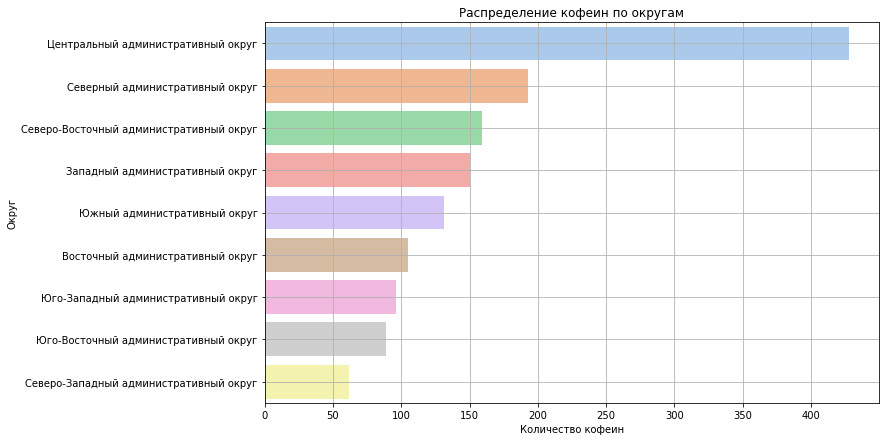

In [38]:
# сгруппируем данные по округам 
data_coffee_district = data_coffee.groupby('district')['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)

# посмотрим, сколько кофеин расположено в каждом округе

plt.figure(figsize=(11, 7))
sns.barplot(x='name', y='district', data=data_coffee_district)
plt.grid(True)
plt.title('Распределение кофеин по округам')
plt.ylabel('Округ')
plt.xlabel('Количество кофеин');

Наибольшее количество кофеен наблюдается в ЦАО - более 420 заведений. В других округах кофеен не больше 200. Центральное расположение кофейни выгодно, так как в центре расположено много офисов, по центру гуляет много туристов, поэтому проходимость выше, чем в отдаленных от центра округах.

### Поиск круглосуточных кофеен

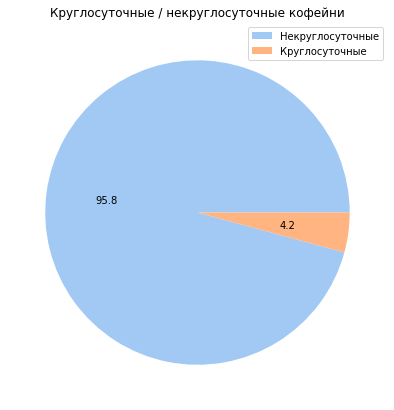

In [39]:
# посмотрим, сколько кофеин открыты круглосуточно
data_coffee_24_7 = data_coffee.groupby('is_24/7')['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)


# построим визуализацию
plt.figure(figsize=(25, 7))
data_coffee_24_7['name'].plot(kind='pie', autopct='%.1f', labeldistance=None)
plt.title('Круглосуточные / некруглосуточные кофейни')
plt.ylabel(None)
plt.legend(["Некруглосуточные", "Круглосуточные"]);
plt.show()

Круглосуточных кофеен очень мало, всего 4.2 % от всего набора данных.

### Просмотр рейтинга кофеен и распределение по округам

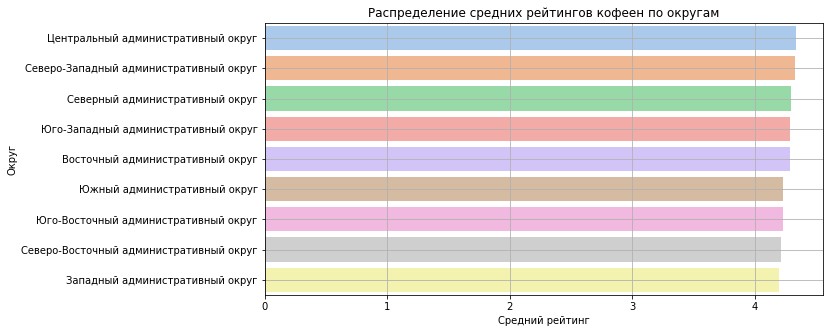

In [40]:
# посмотрим рейтинги кофеен по округам

rating_data_coffee = data_coffee.groupby('district')['rating'].agg('mean') \
    .sort_values(ascending=False).reset_index()

# построим визуализацию
plt.figure(figsize=(10, 5))
sns.barplot(x='rating', y='district', data=rating_data_coffee)
plt.grid(True)
plt.title('Распределение средних рейтингов кофеен по округам')
plt.ylabel('Округ')
plt.xlabel('Средний рейтинг');

Средние рейтинги кофеен по округам значительно не отличаются и являются высокими (более 4 из 5)

### Исследование гипотетической стоимости чашки капучино при открытии

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [41]:
# посмотрим на долю пропусков в столбце middle_coffee_cup
print('Доля пропусков в столбце middle_coffee_cup:',
      (data_coffee['middle_coffee_cup'].isna().sum() / len(data_coffee) * 100).round(2))

# заменим пропуски медианным значеним по округам
for t in data_coffee['district'].unique():
    data_coffee.loc[(data_coffee['district'] == t) & (data_coffee['middle_coffee_cup'].isna()), 'middle_coffee_cup'] = \
    data_coffee.loc[(data_coffee['district'] == t), 'middle_coffee_cup'].median()
print('Доля пропусков в столбце middle_coffee_cup:', 
      (data_coffee['middle_coffee_cup'].isna().sum() / len(data) * 100).round(2)) #проверяем остались ли пропуски

Доля пропусков в столбце middle_coffee_cup: 63.13
Доля пропусков в столбце middle_coffee_cup: 0.0


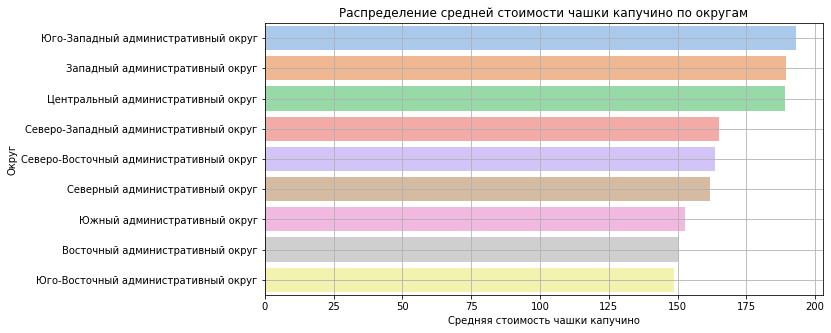

In [42]:
# посмотрим на распределение стоимости чашки капучино в среднем по округам

data_coffee_cup = data_coffee.groupby('district')['middle_coffee_cup'].agg('mean') \
    .sort_values(ascending=False).reset_index()

plt.figure(figsize=(10, 5))
sns.barplot(x='middle_coffee_cup', y='district', data=data_coffee_cup)
plt.grid(True)
plt.title('Распределение средней стоимости чашки капучино по округам')
plt.ylabel('Округ')
plt.xlabel('Средняя стоимость чашки капучино');

Диаграмма показывает, что самая высокая средняя стоимость чашки капучино наблюдается в ЮЗАО, ЗАО И ЦАО - более 180 рублей, самая низкая в ЮВАО, ВАО, ЮАО - около 150 рублей. При открытии кофейни необходимо ориентироваться на среднюю цену чашки капучино округа, в котором планируется размещение.

### Cоотношение сетевых и несетевых кофеен

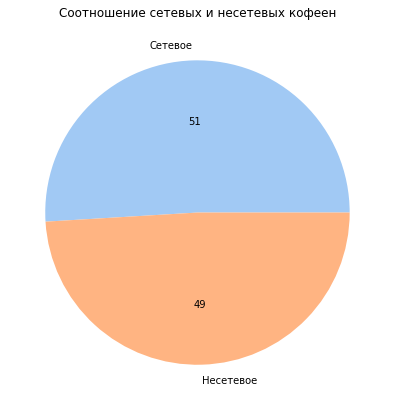

In [43]:
plt.figure(figsize=(25, 7))
data_coffee['chain'].value_counts().plot(kind='pie', autopct='%.0f')
plt.title('Cоотношение сетевых и несетевых кофеен')
plt.ylabel(None)
plt.show()

Соотношение 50/50 - в датасете в равном количестве представлены сетевые и одиночные кофейни.

### **Вывод**

1. Всего кофеен в датасете - 1413. Наибольшее количество кофеен наблюдается в ЦАО - более 420 заведений. В других округах кофеен не больше 200. Центральное расположение кофейни выгодно, так как в центре расположено много офисов, по центру гуляет много туристов, поэтому проходимость выше, чем в отдаленных от центра округах;
2. Круглосуточных кофеен очень мало, всего 4.2 % от всего набора данных;
3. Средние рейтинги кофеен по округам значительно не отличаются и являются высокими (более 4 из 5);
4. Диаграмма показывает, что самая высокая средняя стоимость чашки капучино наблюдается в ЮЗАО, ЗАО И ЦАО - более 180 рублей, самая низкая в ЮВАО, ВАО, ЮАО - около 150 рублей. При открытии кофейни необходимо ориентироваться на среднюю цену чашки капучино округа, в котором планируется размещение;
5. В датасете в равном количестве представлены сетевые и одиночные кофейни.

**Рекомендация для открытия нового заведения:** если заказчики не боятся конкуренции, то выгоднее всего будет открыть кофейню в ЦАО, так как в центре высокая проходимость, поэтому всегда найдется клиент. Выгодным отличием будет открыть круглосуточную кофейню, так как по результатам исследования круглосуточных кофеен всего 5% из общего датасета. Для центральной кофейни гипотетическая стоимость чашки капучино - от 180 рублей. В заисимости от расположения и ЦА эту цену можно увеличивать. Если заказчик не желает тратить время на раскрутку нового бренда, можно открыть кофейню по франшизе, подобрав подходящее место, например, в ЦАО расположено 120 улиц всего с одной кофейней, в узнаваемый и зарекомендовавший себя бренд сразу же придут посетители.

## Выводы по исследованию

<div style="border-radius: 15px; box-shadow: 2px 2px 4px; border: 1px solid; background:Gainsboro; padding: 20px">

В данном прокте мы провели комплексное исследование датасета с заведениями общественного питания Москвы, составленного на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Нашей задачей было — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места, а также дать рекомендацию для открытия нового заведения (кофейню).

В **предобработке данных** мы заполнили пропуски там, где это можно было сделать и добавили столбцы, в результате были внесены следующие изменения в исходные данные:

- в столбце `middle_avg_bill`заменили 62.5 % пропусков медианным значением по категориям
- в столбце `seats`заменили 42.9% пропусков медианным значением по категориям
- в столбце `middle_coffee_cup`заполнили 63.1% пропусков медианным значением по округам
- добавлен столбец `street` с названиями улиц из столбца с адресом
- добавлен столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

В ходе **исследовательского анализа** рынка общепита в Москве были выявлены следующие интересные особености, которые в будущем помогут в выборе подходящего инвесторам места:

1. Большую долю среди заведений занимают кафе (28.3%), рестораны (24.3), кофейни (16.8%), остальные категории не больше 10%;
2. У ресторанов, баров/пабов, кофеен и столовых медианное количество посадочных мест больше 75;
3. В рассматриваемом датасете преобладают несетевые заведения - 62 % против 38%;
4. Пиццерии и булочные чаще являются сетевыми, а кафе, рестораны, бары/пабы и столовые - несетевыми, кофейни - 50/50;
5. Самая популярная сеть в датасете - Шоколадница (120 заведений), далее идут менее крупные сети: Домино'c Пицца, Додо Пицца, One Price Coffee (более 70), Яндекс Лавка, Cofix, Prime (более 50), остальные сетевые заведения представлены в количестве менее 50;
6. Среди Топ-15 сетевых заведений наибольшее количество категорий представлено в ЦАО, в ЗАО представлены все популярные сетевые категории, кроме баров/пабов, в других округах представлены две или одна категории;
7. Большинство заведений датасета расположены в ЦАО, и чем ближе к центру, тем заведений больше;
8. Лидирующей улицей по количеству заведений является проспект Мира - более 175 заведений, более 100 заведений расположены на улицах Профсоюзная, проспект Вернадского, Ленинский проспект, более 75 - Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, на остальных улицах находится менее 75 заведений;
9. Улиц с одним заведением больше всего расположено в ЦАО, и как правило это одна улица - одно заведение одной из категорий кафе, ресторан, кофейня, бар/паб;
10. В ЦАО медиана среднего чека в 2.5 раза выше, чем у ближайшего по значению округа. В ЮАО, ЮВАО, СЗАО наблюдаются самые низкие в датасете медианы среднего чека в заведениях.

Также были даны рекомендации для открытия нового заведения (кофейня):

- Если заказчики не боятся конкуренции, то выгоднее всего будет открыть кофейню в ЦАО, так как в центре высокая проходимость, поэтому всегда найдется клиент; 
- Выгодно отличваться будет круглосуточная кофейня, так как по результатам исследования круглосуточных кофеен всего 5% из общего датасета;
- Для центральной кофейни гипотетическая стоимость чашки капучино - от 180 рублей. В заисимости от расположения и ЦА эту цену можно увеличивать;
- Если заказчик не желает тратить время на раскрутку нового бренда, можно открыть кофейню по франшизе, подобрав подходящее место, например, в ЦАО расположено 120 улиц всего с одной кофейней, в узнаваемый и зарекомендовавший себя бренд сразу же придут посетители.

## Подготовка презентации

Презентация: <https://disk.yandex.ru/i/uabbUzM4fKoTRw>